### Introduction
The aim of this Jupyter Notebook is to demonstrate how inversion results from geophysical resistivity measurements, combined with soil data from reference points, can be used to generate comprehensive soil texture maps for an entire farm. These maps provide critical insights into soil properties across the field and serve as foundational tools for effective field management and decision-making.
First, importing required liberaries:

In [1]:
# %% import libraries
import utm
import fiona
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
from utm import to_latlon
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from inversion import InversionClass
from Soil_Texture import SoilTexture
from matplotlib.colors import LogNorm
from pygimli.frameworks import harmfit
from Data_Processing import DataProcessing
from sklearn.ensemble import IsolationForest
from matplotlib.ticker import FormatStrFormatter
from matplotlib.backends.backend_pdf import PdfPages
from inversion import VESRhoModelling, VES2dModelling


### Inputs

In this section, we define key file paths and names for our analysis. This includes specifying the farm name, paths to KML files for reference points, soil data files, and identifying the relevant field name from the soil data for analysis.


In [5]:
#%% inputs
# Define file paths and names
farmName = 'BDW_Seeschlag'
farmName_Processed = 'BDW_Seeschlag_Processed'
# Import reference points from KML file
kmlFile = 'BW45701_Referenzpunkte_gemessen.kml'
# soil data file
filepath_soil = 'TONIA_soil_data_10cm.csv'
farmName_st = 'Seeschlag' # must be mentioned from column 'Field_name' of the 'filepath_soil'

### Initialize Classes

Here, we create instances of the `DataProcessing`, `InversionClass`, and `SoilTexture` classes. These instances will be used for handling data processing, performing inversion analyses, and integrating soil texture data, respectively.


In [6]:
#%% Create an instance of DataProcessing
# Create an instance of the inversion class 
data_processor = DataProcessing()  
inversion_obj = InversionClass(data_processor)
soil_texture = SoilTexture(data_processor)

### Plot Inversion Results and Soil Types

This section generates plots that combine the inversion results, resistivity measurements (Rhoa), and soil types for the nearest points to the reference locations. The output is saved as a PDF file. This visualization helps in correlating geophysical data with soil texture information at specific reference points.


Reference points saved to harmfitted_LOF_BDW_Seeschlag.txt_farm_reference_Points.csv
Nearest points indices saved to BDW_Seeschlag_nearest_points_indices.csv


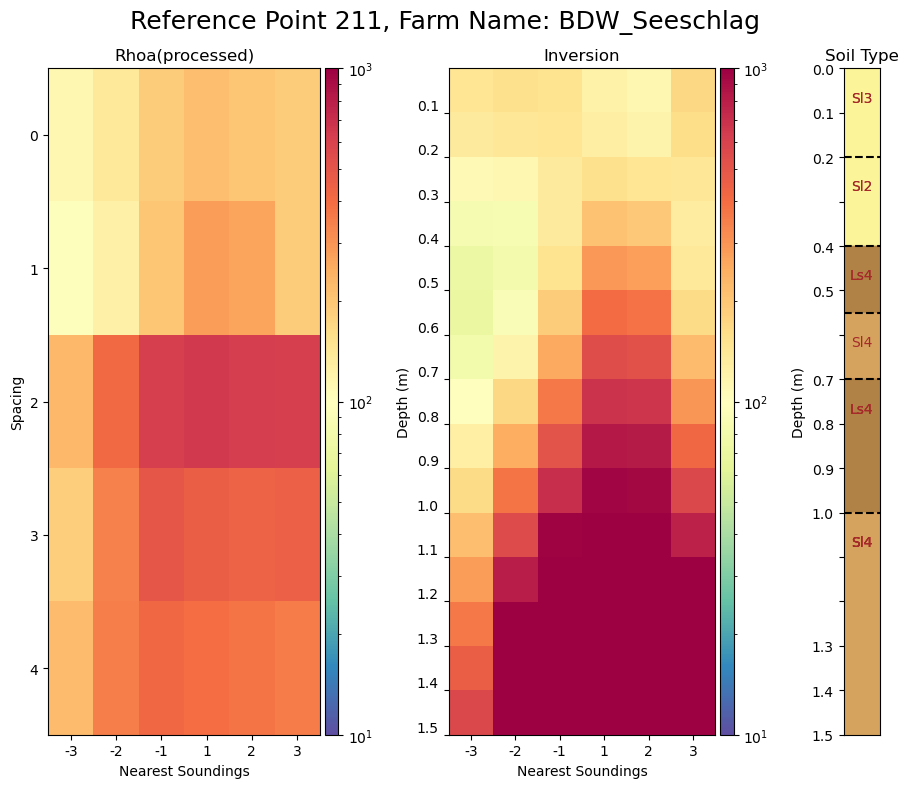

Plots generated successfully!


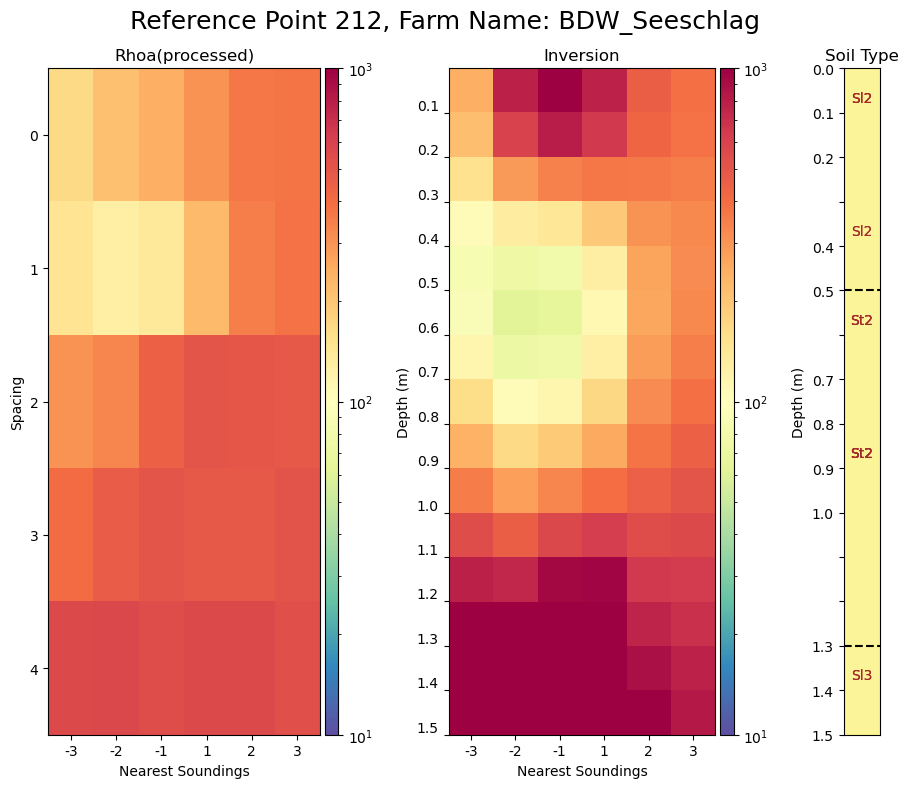

Plots generated successfully!


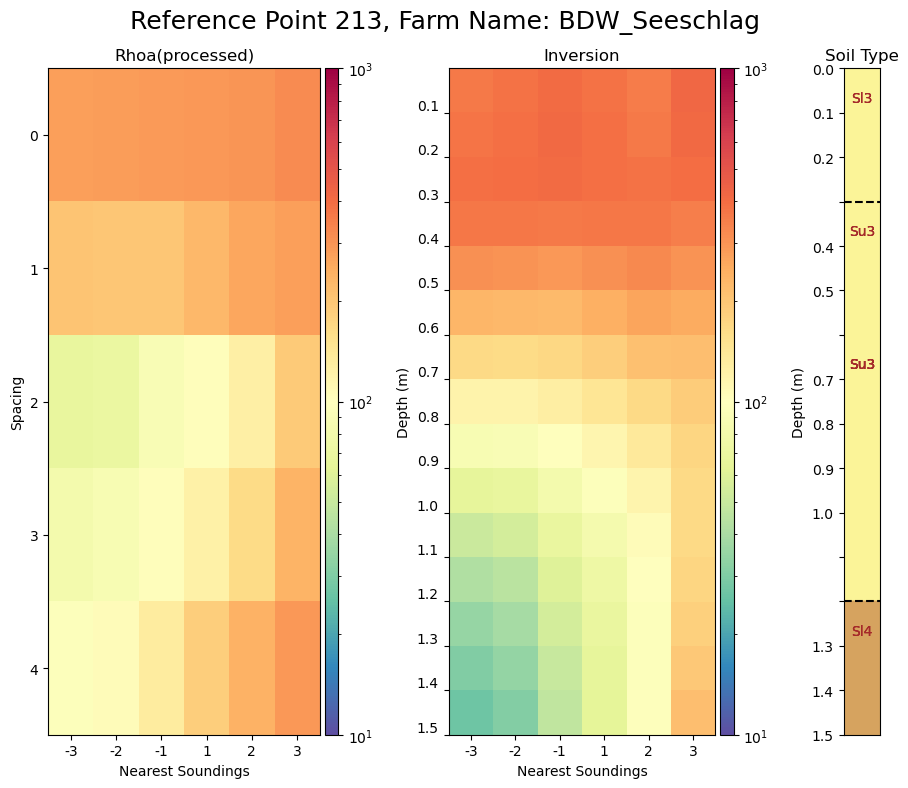

Plots generated successfully!


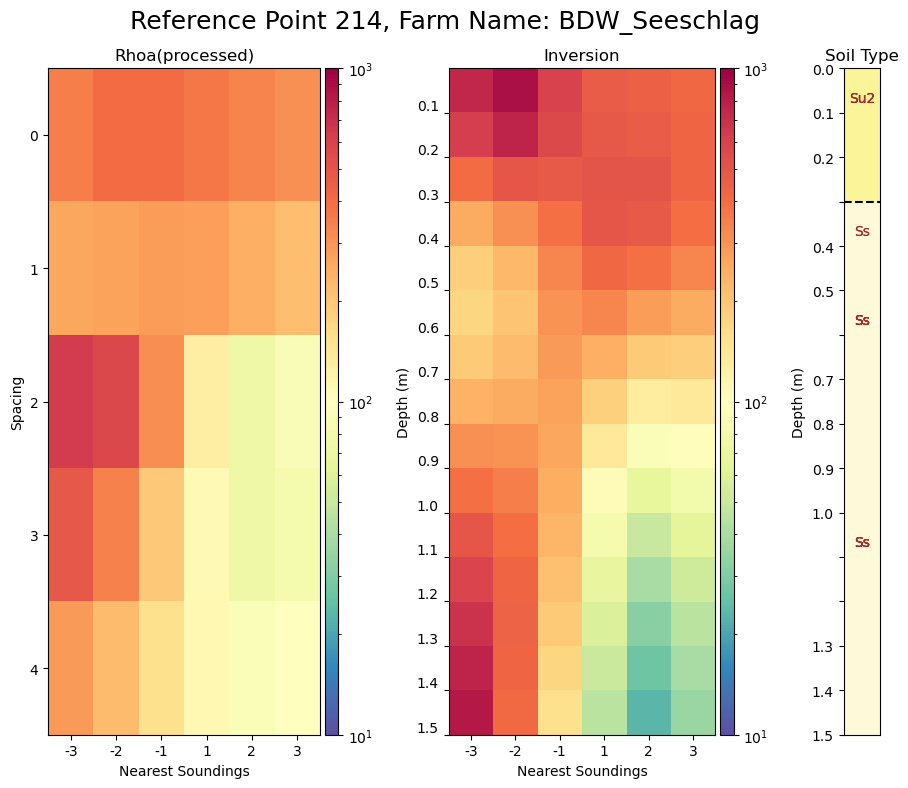

Plots generated successfully!


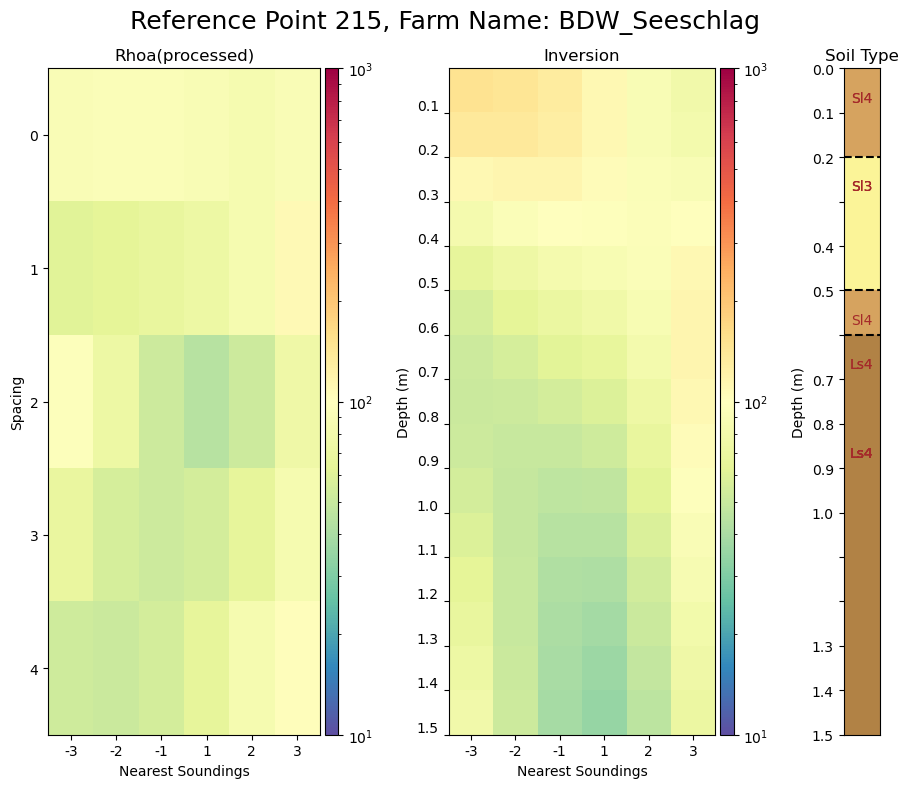

Plots generated successfully!


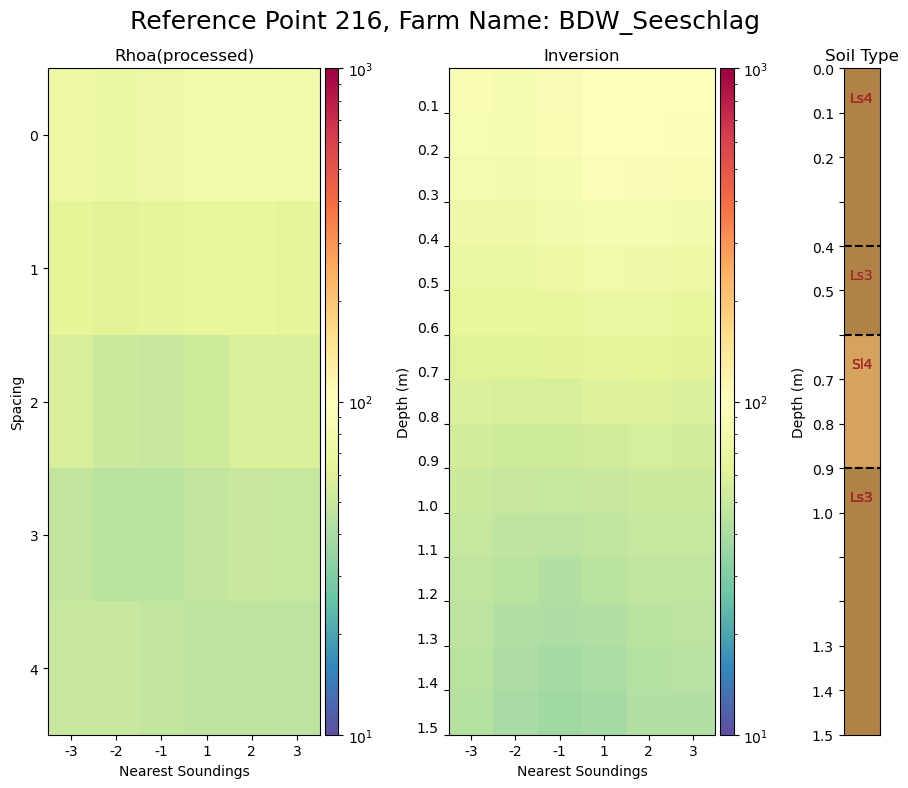

Plots generated successfully!


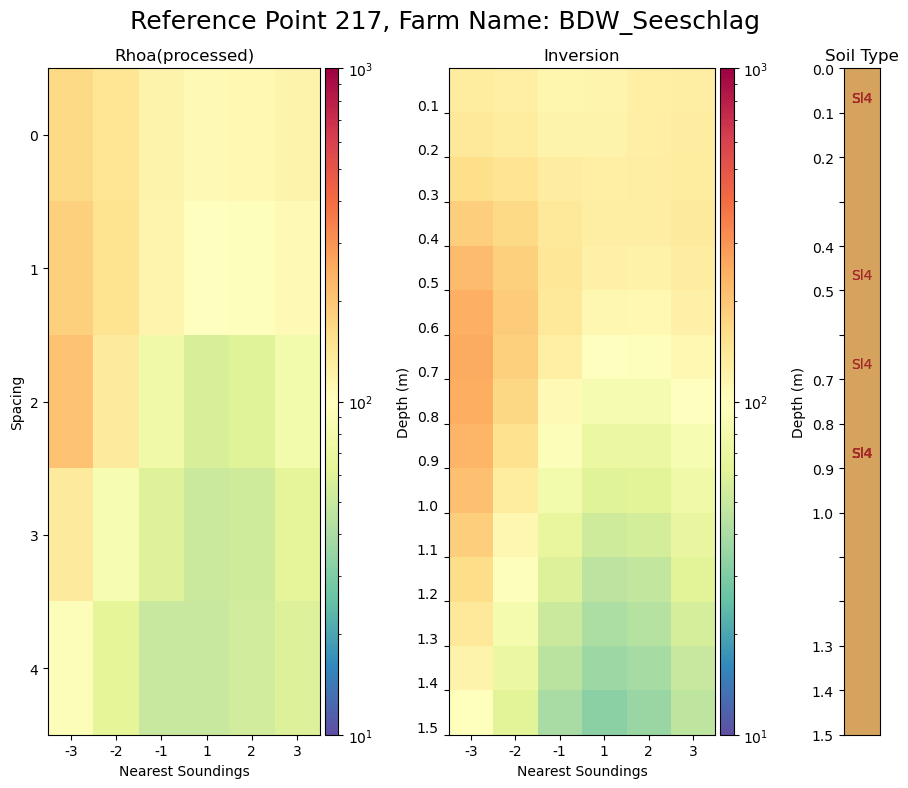

Plots generated successfully!


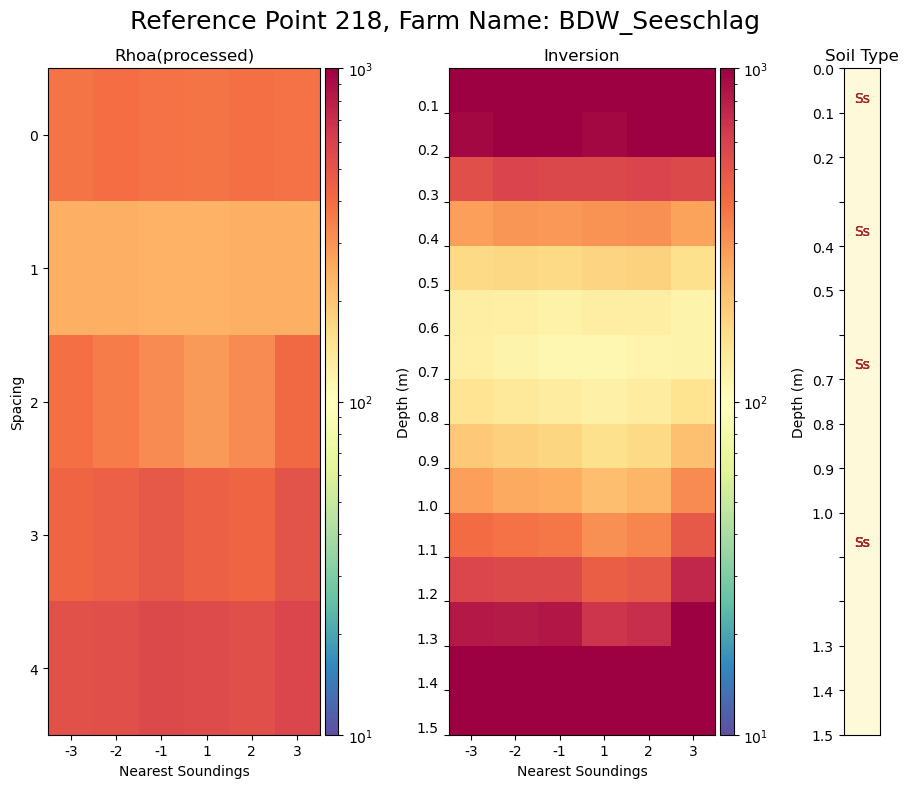

Plots generated successfully!


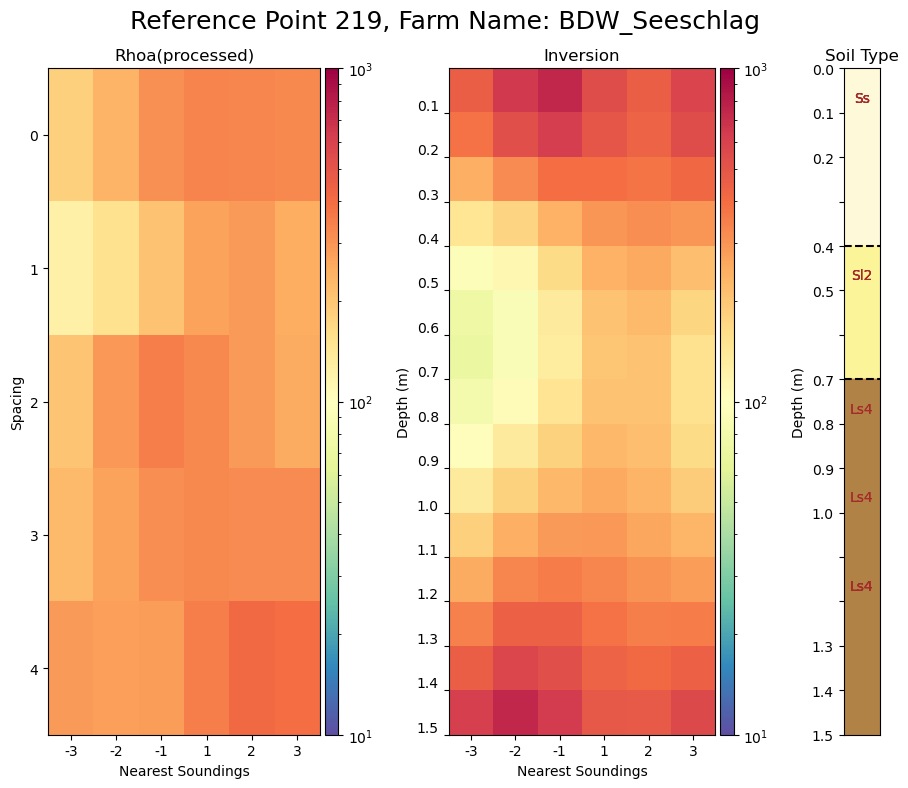

Plots generated successfully!


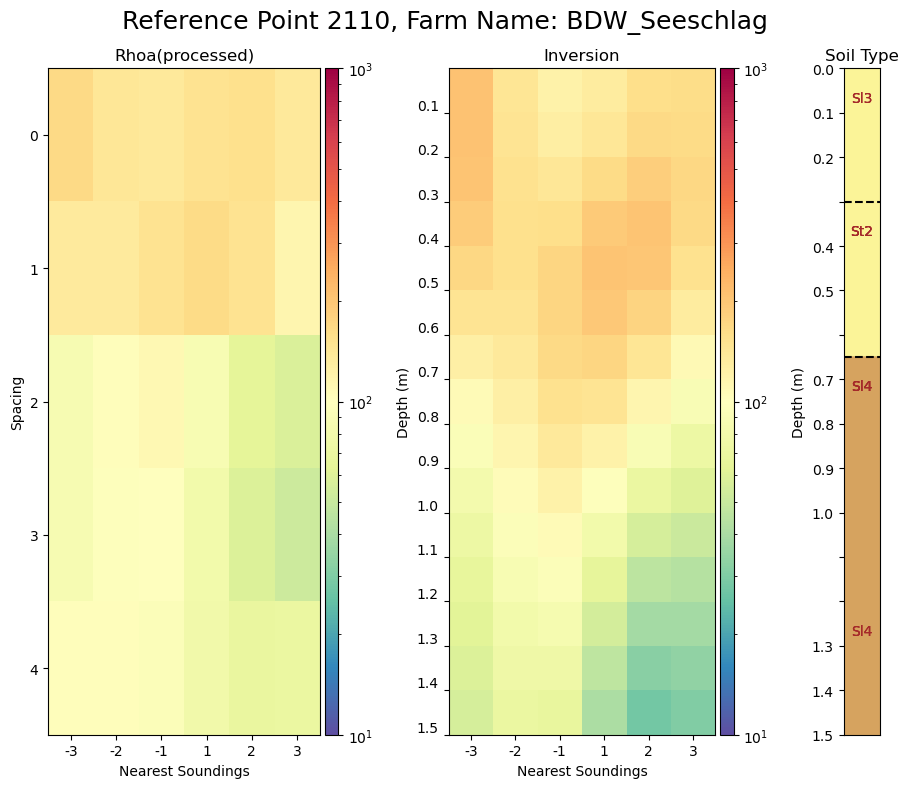

Plots generated successfully!


In [8]:
#%% Plot inversion + Rhoa + Soil Type for the Nearest points to Reference points
data_type_HLOF = 'LOF'
filepath_Processed = f"harmfitted_{data_type_HLOF}_{farmName}.txt"
filepath_inv = f'1Dinv_response_Nearest_{farmName}.csv'
output_filename = f'soil_inversion_plots_{farmName}.pdf'
soil_texture.plot_rho_inv_soil_close_to_ref(filepath_Processed, filepath_soil, filepath_inv, farmName, farmName_st, kmlFile, output_filename)

### Correlate Inversion Results with Soil Properties

This section performs a correlation analysis between the inversion results and soil properties, specifically MPD (Mean Particle Diameter), CLAY, SILT, and SAND content. The goal is to understand how geophysical measurements relate to different soil texture parameters, which aids in refining soil classification and management strategies.


In [9]:
#%% Correlate inversion results with soil data based on MPD, CLAY, SILT, and SAND.
filepath_Processed = f"harmfitted_{data_type_HLOF}_{farmName}.txt"
filepath_soil = 'TONIA_soil_data_10cm.csv'
filepath_inv = f'1Dinv_response_Nearest_{farmName}.csv'

cluster_labels, res_range_soil_properties = soil_texture.correlate_inversion_with_soil_properties(
    filepath_inv=filepath_inv,
    filepath_soil=filepath_soil,
    farmName=farmName_st
)

Spearman's Correlation Coefficient for MPD at Reference Point 211: -0.54, P-value: 0.04
The observed correlation is statistically significant for MPD at Reference Point 211.

Spearman's Correlation Coefficient for CLAY at Reference Point 211: 0.86, P-value: 0.00
The observed correlation is statistically significant for CLAY at Reference Point 211.

Spearman's Correlation Coefficient for SILT at Reference Point 211: 0.09, P-value: 0.76
The observed correlation is not statistically significant for SILT at Reference Point 211.

Spearman's Correlation Coefficient for SAND at Reference Point 211: -0.32, P-value: 0.24
The observed correlation is not statistically significant for SAND at Reference Point 211.

Spearman's Correlation Coefficient for MPD at Reference Point 212: -0.08, P-value: 0.77
The observed correlation is not statistically significant for MPD at Reference Point 212.

Spearman's Correlation Coefficient for CLAY at Reference Point 212: -0.78, P-value: 0.00
The observed correla

C:\Program Files\software\Anaconda\lib\site-packages\scipy\stats\_stats_py.py:4878: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


### Plot Soil Texture Maps Based on MPD, CLAY, SILT, and SAND

In this section, we generate and visualize soil texture maps for the entire farm based on the correlation results. These maps illustrate the spatial distribution of soil properties such as MPD (Mean Particle Diameter), CLAY, SILT, and SAND, providing valuable insights for field management and soil classification.


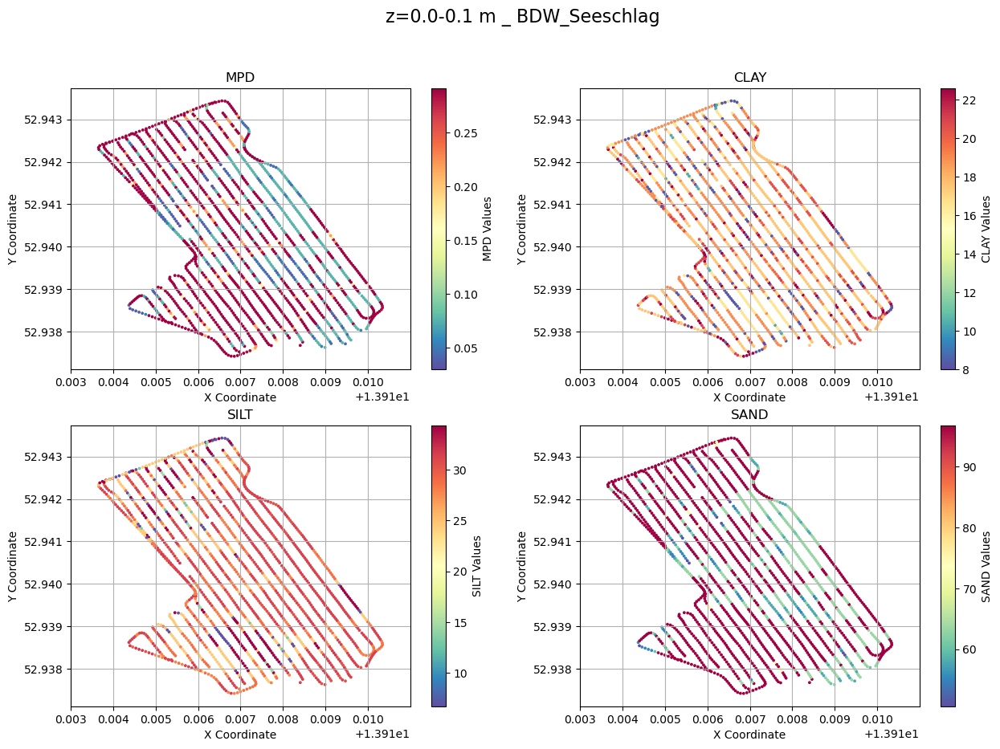

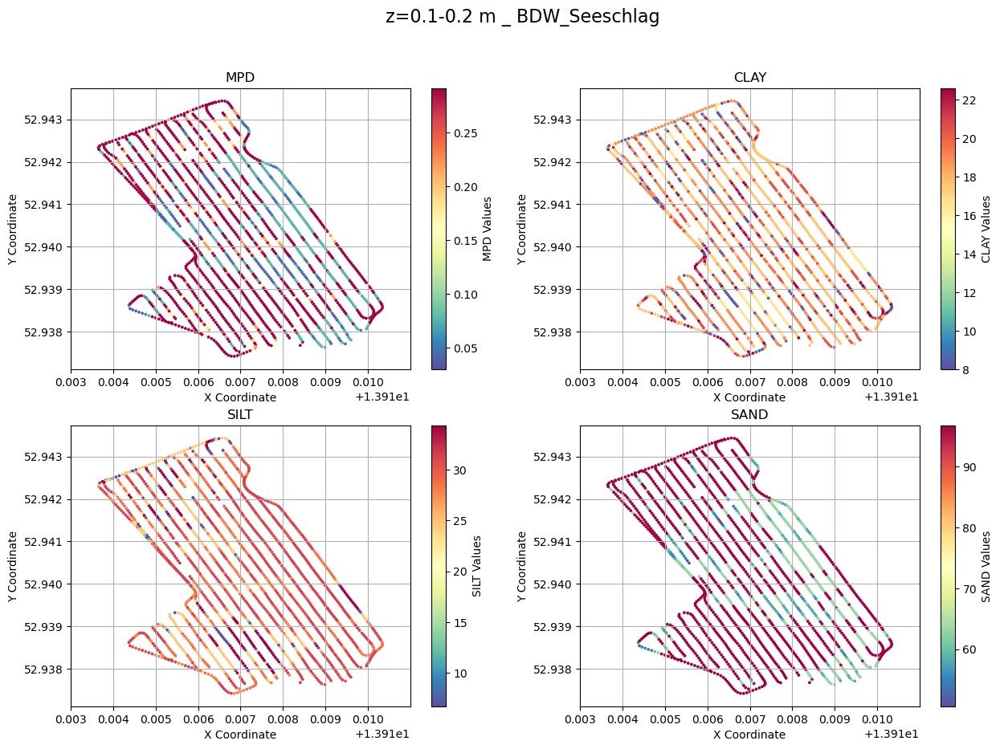

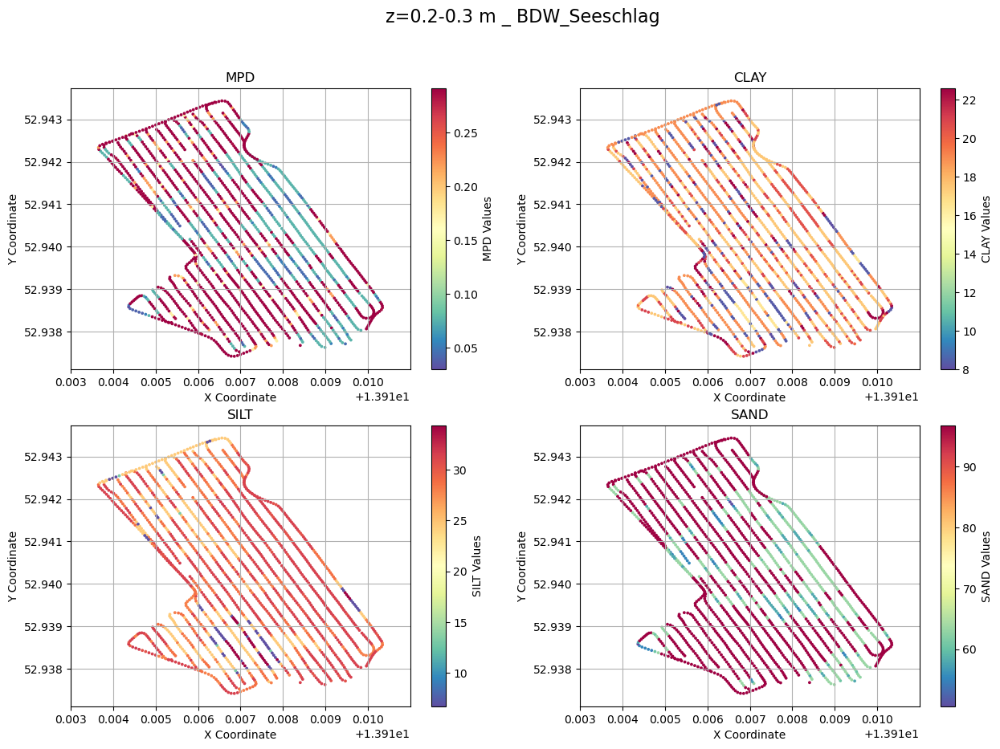

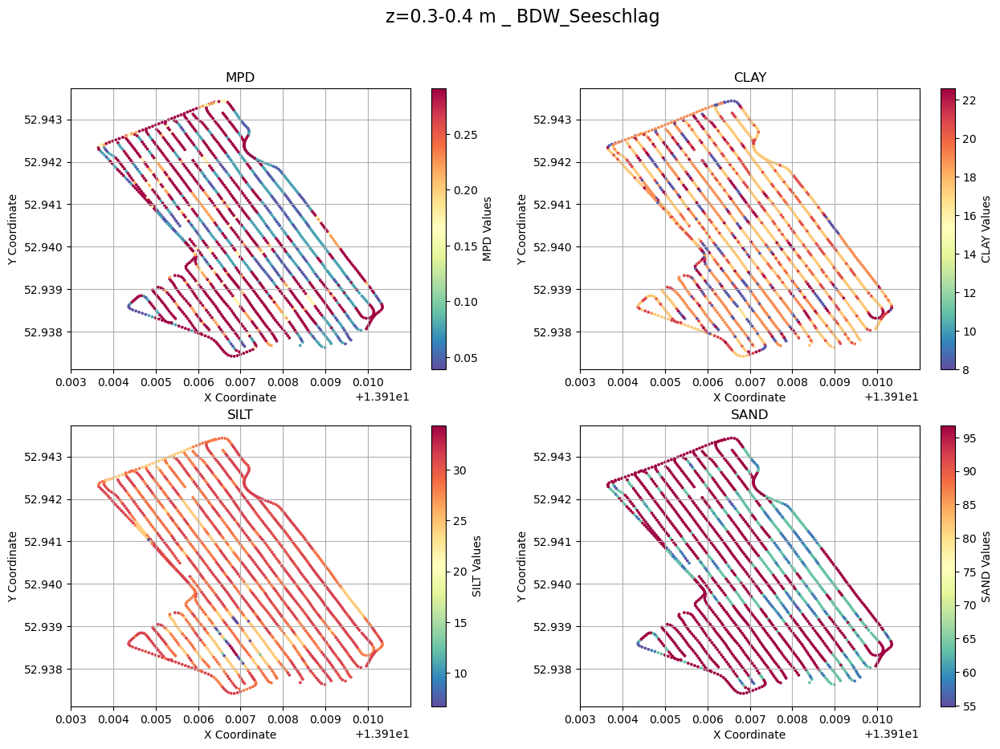

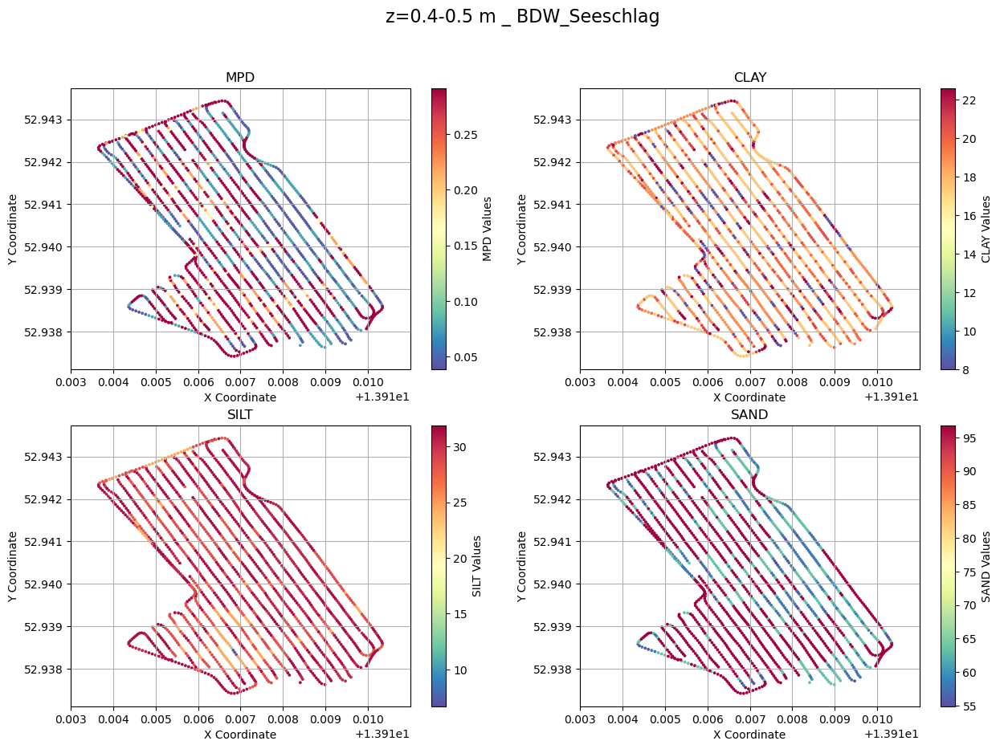

...

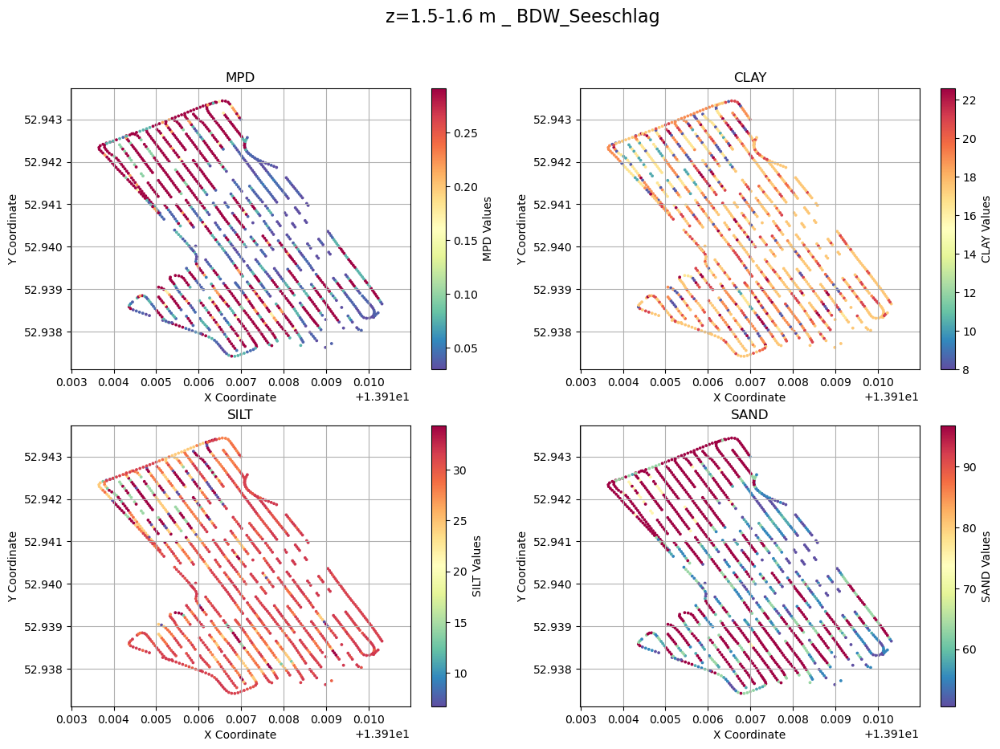

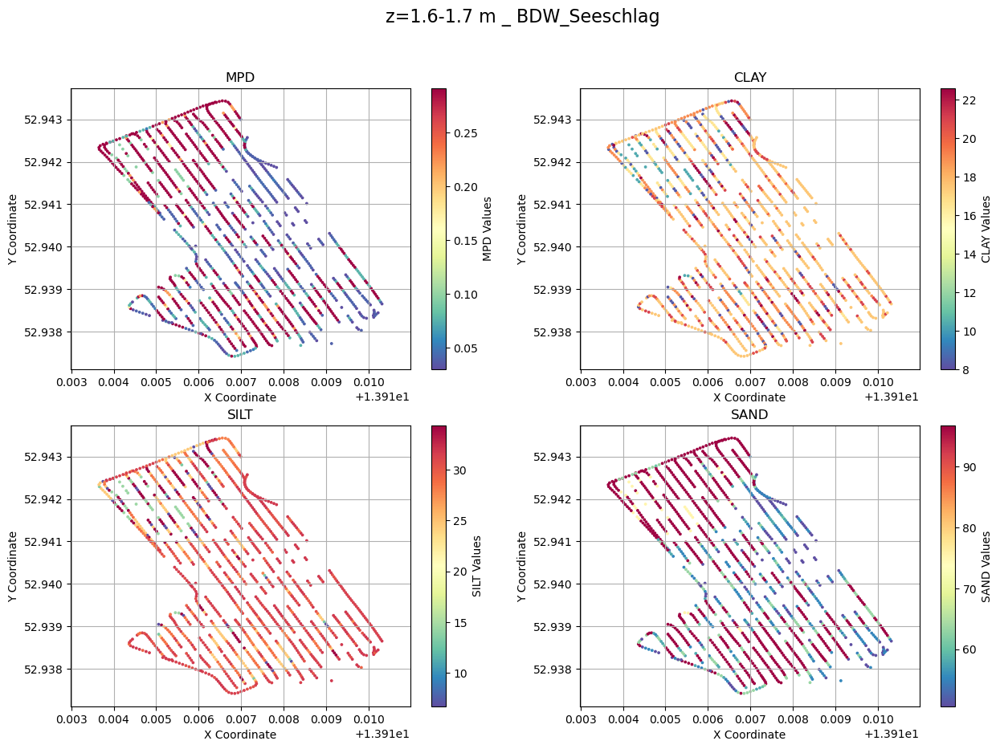

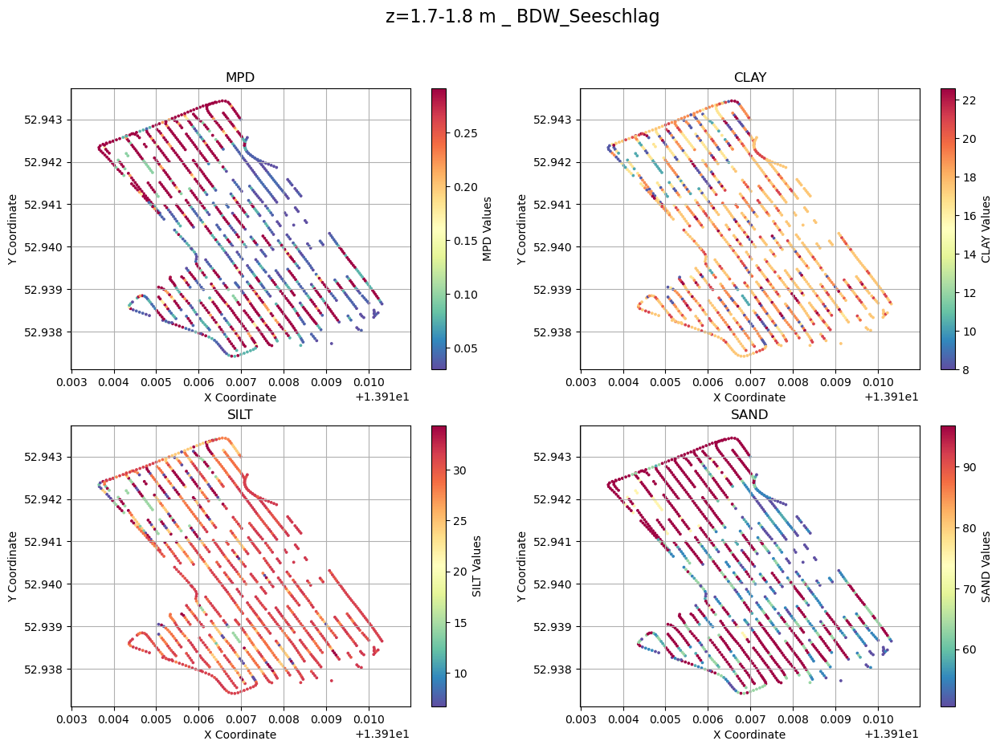

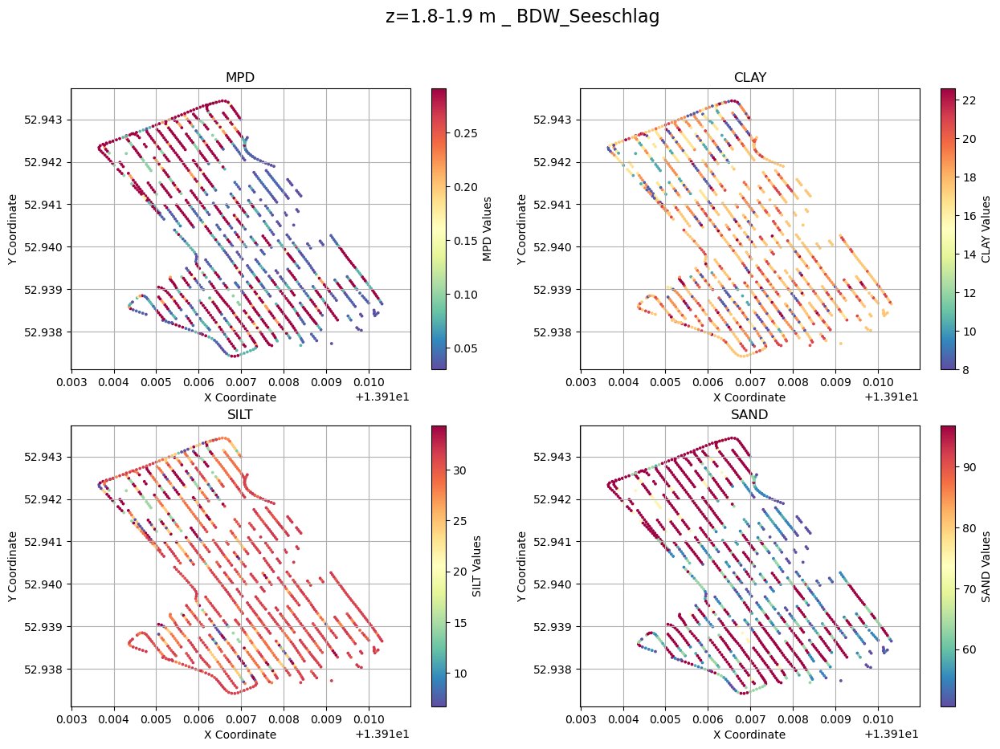

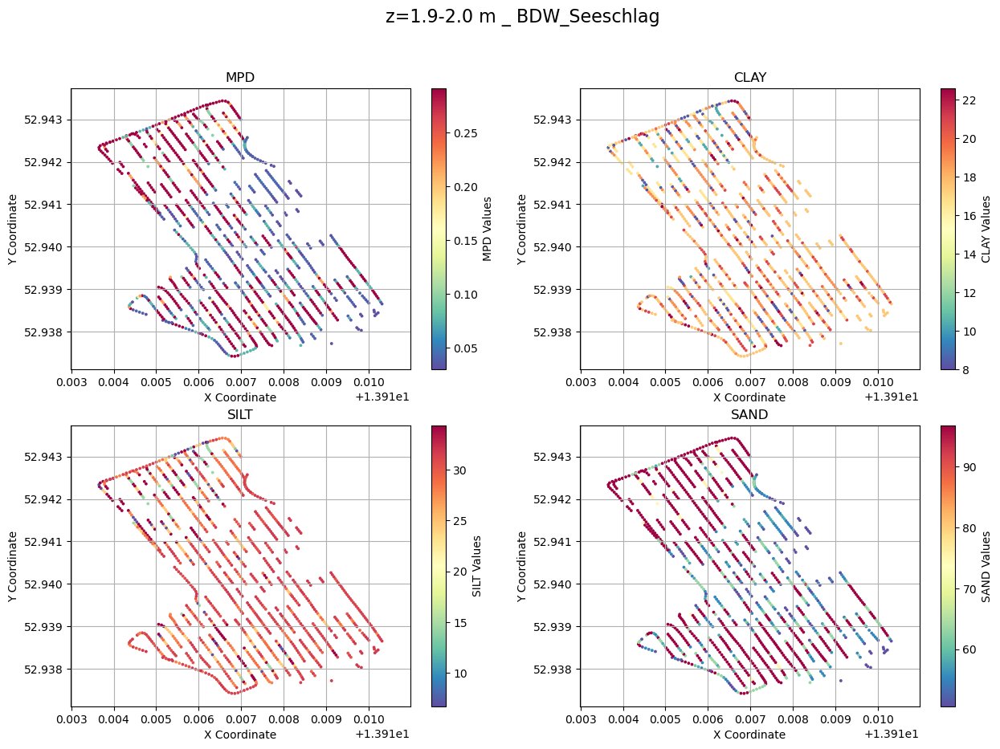

In [11]:
#%% plot_soil_texture_maps based on MPD, CLAY, SILT, and SAND.
inv_res_filepath = f'1Dinv_response_all_lines_{farmName_Processed}.csv'
soil_texture.plot_soil_texture_maps(
    inv_res_filepath=inv_res_filepath,
    res_range_soil_properties=res_range_soil_properties,
    farmName=farmName
)
#%%
